In [1]:
using Revise
using Plots
using QuantumOptics
using QuantumOpticsBase

include("TwoSidedMasterEquations.jl")
using .TwoSidedMasterEquations


In [2]:
function gauss_amplitude(t,Tpulse,tc) # Amplitude of Gaussian pulse
    return 1 / (2 * π * Tpulse^2)^(1/4) * exp(-(t - tc).^2 / (4 * Tpulse^2)) 
end

function QFI_Γ_TSME_Gauss_pulse(timespan,α,Tpulse,tc,Γ; δ = 0., ρ0 = nothing , ϵ = .001)
                
        basis_TLS = SpinBasis(1//2)

        if ρ0 == nothing
            ρ0 = spindown(basis_TLS)
        end 

        σm=sigmam(basis_TLS)
        σp=sigmap(basis_TLS)
    
        function fpulse(t,rho)
            Jl = [ sqrt(Γ)*σm];
            Jr = [ sqrt(Γ+ϵ)*σm ];
            Hdetuning = δ*σp*σm
            
            Hl = 1im*sqrt(Γ)*gauss_amplitude(t, Tpulse, tc)*(conj(α)*σm-α*σp)
            Hr = 1im*sqrt(Γ+ϵ)*gauss_amplitude(t, Tpulse, tc)*(conj(α)*σm-α*σp)
            
            return ( Hdetuning + Hl , Hdetuning + Hr, Jl, Jr)
        end

    tt, res = master_twosided_dynamic(timespan, ρ0, fpulse; fout=calc_tracenorm_and_abstr)

    return (time=tt, QFIfield=[8 * (1 - fid[1]) / (ϵ^2) for fid = res], QFIjoint=[8 * (1 - fid[2]) / (ϵ^2) for fid = res])
end

QFI_Γ_TSME_Gauss_pulse (generic function with 1 method)

In [3]:
Γval = 1.
tspan = (0.0:0.0001:20.)

Tpulse = 0.1/Γval;

res = QFI_Γ_TSME_Gauss_pulse(tspan, 1.0, Tpulse, 6.0 * Tpulse, Γval; δ=0.0, ρ0=nothing, ϵ=0.01)

(time = [0.0, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008, 0.0009  …  19.9991, 19.9992, 19.9993, 19.9994, 19.9995, 19.9996, 19.9997, 19.9998, 19.9999, 20.0], QFIfield = [0.0, 2.6645352591003757e-11, 8.881784197001252e-12, 0.0, 0.0, 1.7763568394002505e-11, 8.881784197001252e-12, 0.0, 0.0, 8.881784197001252e-12  …  0.7931033023922396, 0.7931033024455303, 0.7931033024721756, 0.7931033025165846, 0.7931033025432299, 0.7931033025521117, 0.793103302578757, 0.7931033026054024, 0.7931033026320478, 0.7931033026586931], QFIjoint = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.7931036025254912, 0.793103602534373, 0.793103602534373, 0.793103602534373, 0.793103602534373, 0.793103602534373, 0.793103602534373, 0.793103602534373, 0.793103602534373, 0.793103602534373])

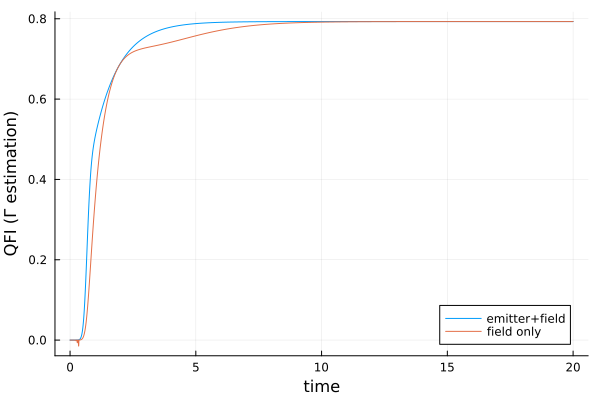

In [4]:
plot(res.time,res.QFIjoint,label="emitter+field")
plot!(res.time, res.QFIfield,label="field only")
xlabel!("time")
ylabel!("QFI (Γ estimation)")